# Celebrity Recognize with Google Cloud Vector Search

https://cloud.google.com/vertex-ai/generative-ai/docs/model-reference/multimodal-embeddings-api?hl=ko

## Configuration

In [1]:
PROJECT_ID = "jc-gcp-project"
LOCATION = "us-central1"
MODEL = "gemini-1.5-flash-002"
#MODEL = "gemini-pro-experimental"
BUCKET = "jc-gcp-project-01"

import base64
import vertexai
from vertexai.generative_models import GenerativeModel

## Get Unstructured Data from DB

In [2]:
%%bigquery actor_title
select *, REGEXP_EXTRACT(uri, r'/([^/]+)_\d+.jpg') AS celeb_name from `jc-gcp-project.sec_test.celeb_images`;

Query is running:   0%|          |

Downloading:   0%|          |

In [3]:
actor_title.head()

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name
0,gs://jc-gcp-project-01/SEC_content_recognition...,1733809433453312,image/jpeg,549738,9432c546a7ced8f1268d3b026084c0ae,2024-12-10 05:43:53.456000+00:00,[],Aaron_Kwok
1,gs://jc-gcp-project-01/SEC_content_recognition...,1733809442762003,image/jpeg,354898,a1ec644519a977965da362dd18b37233,2024-12-10 05:44:02.764000+00:00,[],Aaron_Kwok
2,gs://jc-gcp-project-01/SEC_content_recognition...,1733809402054001,image/jpeg,364560,14accef40da6c194875180ef27a066b0,2024-12-10 05:43:22.058000+00:00,[],Aaron_Kwok
3,gs://jc-gcp-project-01/SEC_content_recognition...,1733809387532504,image/jpeg,396517,31f3032d3300ab92f5d02d381d53465f,2024-12-10 05:43:07.535000+00:00,[],Aaron_Kwok
4,gs://jc-gcp-project-01/SEC_content_recognition...,1733809485545562,image/jpeg,193992,349894be8bb4ff486a901034baa11bc4,2024-12-10 05:44:45.546000+00:00,[],Aaron_Kwok


# Vectorize

In [ ]:
import pandas as pd
import copy
import numpy as np
import vertexai
from vertexai.vision_models import Image, MultiModalEmbeddingModel

In [ ]:
pd.options.mode.chained_assignment = None 

In [ ]:
### 코드 수정 고려 필요
# images = [Image.load_from_file(url) for url in actor_title['uri']]
# embeddings = model.get_embeddings(images=images, contextual_text="Colosseum", dimension=embedding_dimension)

In [ ]:
# TODO(developer): Update & uncomment line below
PROJECT_ID = "jc-gcp-project"
vertexai.init(project=PROJECT_ID, location="us-central1")

# TODO(developer): Try different dimenions: 128, 256, 512, 1408
embedding_dimension = 1408
model = MultiModalEmbeddingModel.from_pretrained("multimodalembedding@001")

actor_title['image_embedding'] = None
actor_title['text_embedding'] = None

for i in range(len(actor_title)):
    if i % 10 == 0:
        print(round((i/len(actor_title))*100, 0), '%, ', end = ' ')
   
    img_url = actor_title.iloc[i]['uri']
    txt_url = actor_title.iloc[i]['celeb_name']
    # print(img_url)
    # print(txt_url)
    image = Image.load_from_file(
        img_url
    )

    embeddings = model.get_embeddings(
        image=image,
        contextual_text=txt_url,
        dimension=embedding_dimension,
    )
    actor_title.image_embedding.iloc[i] = embeddings.image_embedding
    actor_title.text_embedding.iloc[i] = embeddings.text_embedding
    # if i == 2:
    #     break

# print(f"Image Embedding: {embeddings.image_embedding}")
# print(f"Text Embedding: {embeddings.text_embedding}")

# Example response:
# Image Embedding: [0.0622573346, -0.0406507477, 0.0260440577, ...]
# Text Embedding: [0.27469793, -0.146258667, 0.0222803634, ...]

#### Check Embedded Result

In [ ]:
actor_title[['id', 'uri', 'celeb_name', 'image_embedding', 'text_embedding']]

#### Save result to DB

In [ ]:
## DF --> BQ TABLE
from google.cloud import bigquery
client = bigquery.Client(PROJECT_ID)
table_id = 'jc-gcp-project.sec_test.multi_embedding'
job_config = bigquery.LoadJobConfig(
    # 스키마 자동 감지 (옵션)
    autodetect=True,
    # 기존 테이블 처리 방식 설정 (옵션)
    write_disposition="WRITE_APPEND",  # WRITE_APPEND, WRITE_TRUNCATE, WRITE_EMPTY 중 선택
)
job = client.load_table_from_dataframe(actor_title, table_id, job_config=job_config)  
job.result()

In [4]:
%%bigquery actor_title
select * from `jc-gcp-project.sec_test.multi_embedding`;

Query is running:   0%|          |

Downloading:   0%|          |

In [8]:
actor_title.head()

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
0,gs://jc-gcp-project-01/SEC_content_recognition...,1733809712124453,image/jpeg,330472,75b9f00c24b6f311feaf108a9f2be9b4,2024-12-10 05:48:32.126000+00:00,[],BoA,"[-0.0203755405, 0.0286840778, -0.0428621918, 0...","[-0.00326911313, 0.0172276031, -0.026817929, 0..."
1,gs://jc-gcp-project-01/SEC_content_recognition...,1733809656007891,image/jpeg,371735,99792407bdbc937c61b55ede98fde93b,2024-12-10 05:47:36.009000+00:00,[],BoA,"[0.000171662556, 0.02452741, -0.062470261, 0.0...","[-0.00326911081, 0.0172275845, -0.0268179681, ..."
2,gs://jc-gcp-project-01/SEC_content_recognition...,1733809716889445,image/jpeg,590007,9709802d314e1dd50b489a65bbeb5a75,2024-12-10 05:48:36.891000+00:00,[],BoA,"[0.030457655, 0.0130578568, -0.0409684405, -0....","[-0.00326912082, 0.0172275826, -0.0268179663, ..."
3,gs://jc-gcp-project-01/SEC_content_recognition...,1733809745269330,image/jpeg,391649,d67f4f724d34fae0bc1c6980e0598847,2024-12-10 05:49:05.272000+00:00,[],BoA,"[-0.0138065396, 0.025863234, -0.00181279867, 0...","[-0.00326912082, 0.0172275826, -0.0268179663, ..."
4,gs://jc-gcp-project-01/SEC_content_recognition...,1733809848998438,image/jpeg,501847,3b2fd41a12f8c3e9bde0b51965ac7058,2024-12-10 05:50:49+00:00,[],BoA,"[-0.0188917, 0.00160359184, 0.0264849328, 0.02...","[-0.00326912082, 0.0172275826, -0.0268179663, ..."


In [9]:
import io
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf

def printImages(results):
    image_results_list = list(results)
    amt_of_images = len(image_results_list)

    fig, axes = plt.subplots(nrows=amt_of_images, ncols=2, figsize=(20, 20))
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.5)
    for i in range(amt_of_images):
        gcs_uri = image_results_list[i][0]
        text = image_results_list[i][1]
        f = tf.io.gfile.GFile(gcs_uri, 'rb')
        stream = io.BytesIO(f.read())
        img = Image.open(stream)
        axes[i, 0].axis('off')
        axes[i, 0].imshow(img)
        axes[i, 1].axis('off')
        axes[i, 1].text(0, 0, text, fontsize=10)
    plt.show()

2024-12-17 03:29:52.989230: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-17 03:29:52.989293: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-17 03:29:52.994446: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-17 03:29:53.520408: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Check similarity

### Sample 1) 최민식

In [10]:
# df[df['title'] == 'Avatar'].embedding.iloc[0] # avartar 임베딩
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Choi_Min-sik_2.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
472,gs://jc-gcp-project-01/SEC_content_recognition...,1733809621550225,image/jpeg,214302,d0f26494a36a194b37af50f0b3f9f563,2024-12-10 05:47:01.552000+00:00,[],Choi_Min-sik,"[-0.0448453315, 0.0709179267, -0.0194734111, -...","[0.0173361748, -0.0349885635, -0.0144914836, 0..."


In [13]:
import random
import numpy as np

# pick one of them as a key question
# key = random.randint(0, len(df))
key = 472
# calc dot product between the key and other questions
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)

# print similarities for the first 5 questions
similarities[:5]

array([0.57369538, 0.55690217, 0.37171322, 0.4450563 , 0.37798473])

In [ ]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:3]

In [14]:
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Choi_Min-sik

1.0000 Choi_Min-sik
0.9031 Choi_Min-sik
0.8830 Choi_Min-sik
0.8464 Lee_Sung-min
0.8460 Kwak_Do-won
0.8449 Kwak_Do-won
0.8348 Lee_Sung-min
0.8309 Kwak_Do-won
0.8297 Park_Hyuk-kwon
0.8286 Lee_Sung-min
0.8262 Kwak_Do-won
0.8234 Choi_Min-sik
0.8205 Lee_Sung-min
0.8199 Kwak_Do-won
0.8146 Kwak_Do-won
0.7917 Ma_Dong-seok
0.7901 Kim_Sung-kyun
0.7863 Lee_Sung-min
0.7842 Lee_Sung-min
0.7840 Park_Hyuk-kwon


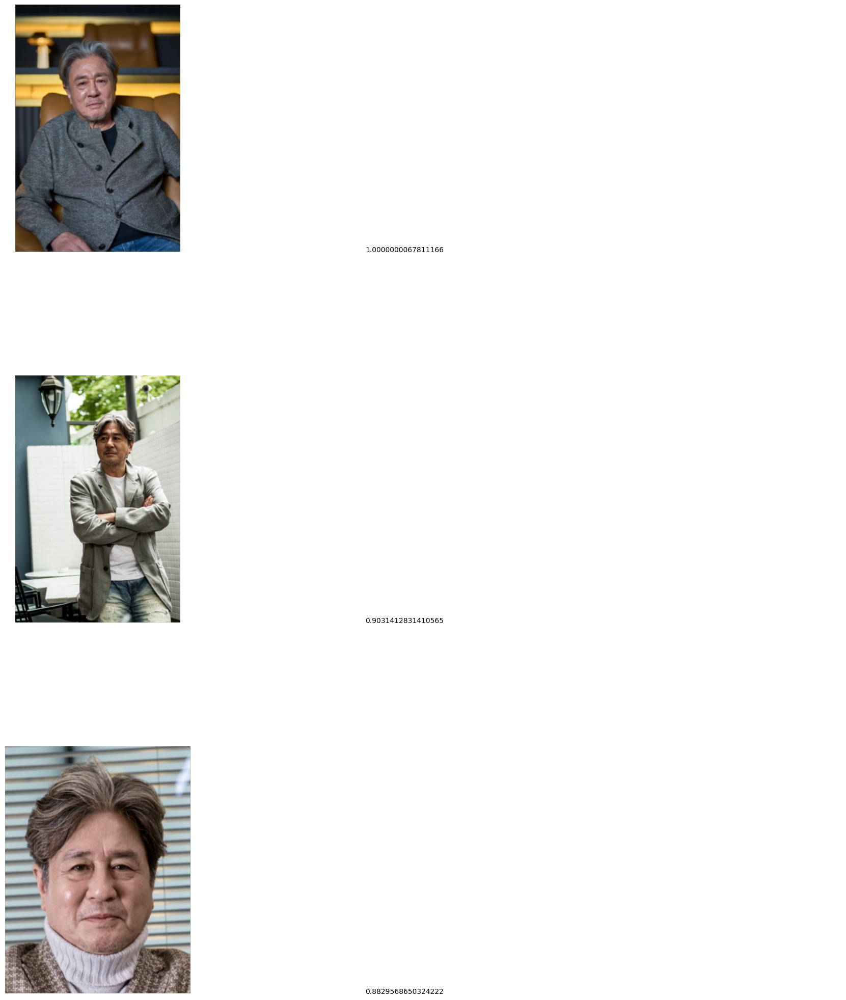

In [26]:
printImages(img_df)

### Sample2) Angelique Cabral

In [27]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Angelique_Cabral_0.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
900,gs://jc-gcp-project-01/SEC_content_recognition...,1733809782639809,image/jpeg,437709,512e295a36378d50d5c64bb2eedacf53,2024-12-10 05:49:42.641000+00:00,[],Angelique_Cabral,"[-0.025387777, 0.0492842086, -0.0150940735, 0....","[0.00145378336, 0.00985591859, 0.0043784976, 0..."


In [29]:
key = 900
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Angelique_Cabral

1.0000 Angelique_Cabral
0.9254 Angelique_Cabral
0.8599 Angelique_Cabral
0.7415 Angelique_Cabral
0.7144 Angelique_Cabral
0.7001 Angelique_Cabral
0.6881 Fabrizio_Rongione
0.6809 Carol_Kane
0.6712 Rebecca_Ferguson
0.6625 Fabrizio_Rongione
0.6600 Angelique_Cabral
0.6576 Bae_Jong-ok
0.6468 Carol_Kane
0.6424 Awkwafina
0.6409 Alan_Tudyk
0.6402 Fabrizio_Rongione
0.6325 Ha_Ji-won
0.6316 Angelique_Cabral
0.6305 America_Ferrera
0.6299 America_Ferrera


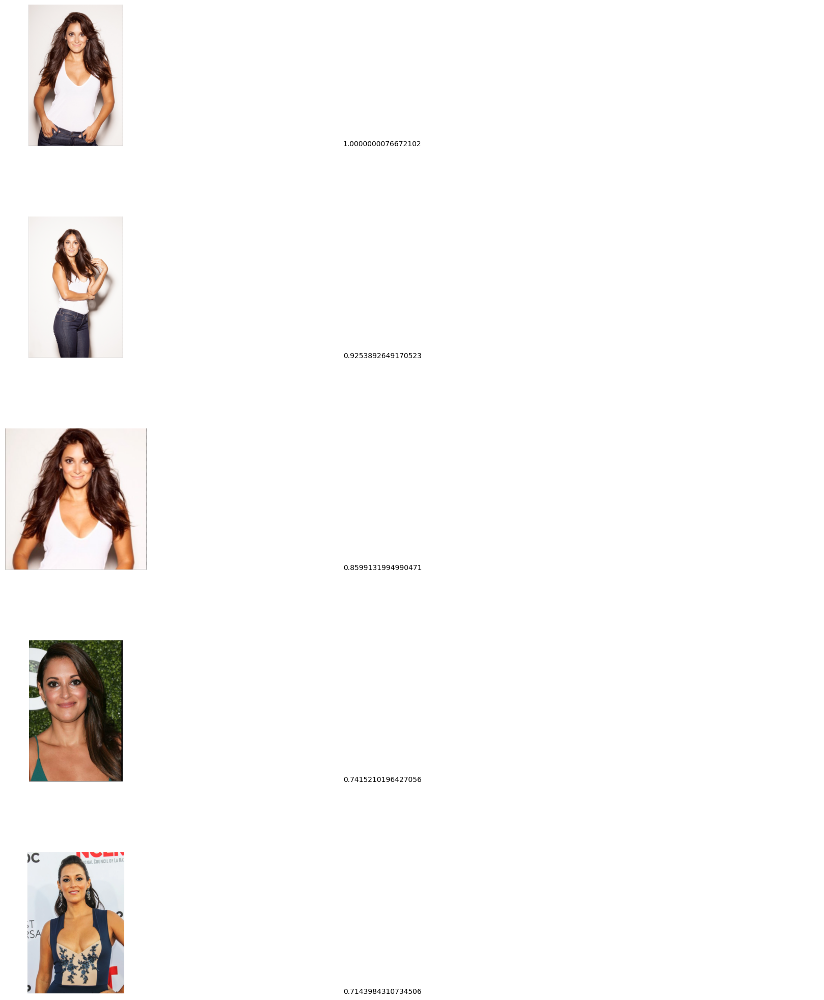

In [32]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample3) 배종옥

In [33]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Bae_Jong-ok_2.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
301,gs://jc-gcp-project-01/SEC_content_recognition...,1733809864446579,image/jpeg,605141,3af78dfe81068737470d2929e2b94fdd,2024-12-10 05:51:04.448000+00:00,[],Bae_Jong-ok,"[-0.0279368237, 0.0661996678, -0.0183763932, 0...","[0.0215554629, -0.061703261, -0.0128501365, -0..."


In [44]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Bae_Jong-ok_2.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Bae_Jong-ok

1.0000 Bae_Jong-ok
0.9061 Bae_Jong-ok
0.8860 Bae_Jong-ok
0.8741 Hwang_Jung-min
0.8525 Yum_Jung-ah
0.8262 Chun_Woo-hee
0.8058 Baek_Jin-hee
0.7981 Bae_Jong-ok
0.7910 Yum_Jung-ah
0.7905 Bae_Jong-ok
0.7904 Yum_Jung-ah
0.7843 Bae_Jong-ok
0.7761 Yum_Jung-ah
0.7721 Han_Ye-ri
0.7677 Han_Ye-ri
0.7655 Esom
0.7641 Bae_Jong-ok
0.7636 Lee_Sung-min
0.7625 Kwak_Do-won
0.7623 Yum_Jung-ah


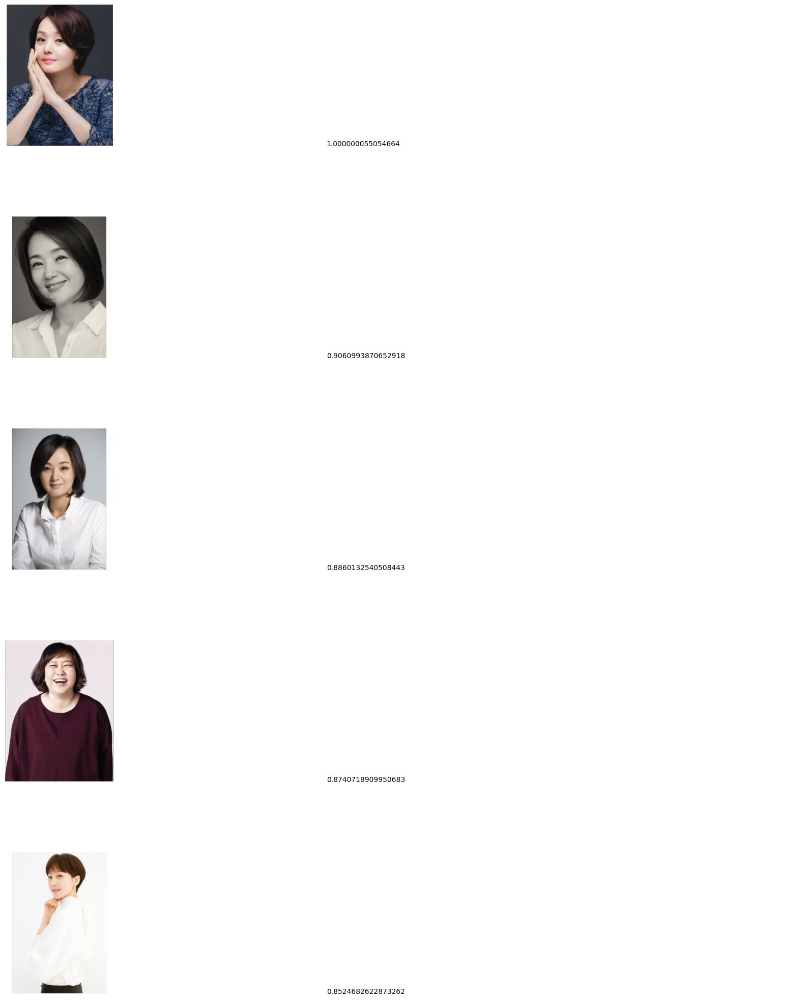

In [45]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample4) Carol Kane

In [46]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Carol_Kane_0.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
210,gs://jc-gcp-project-01/SEC_content_recognition...,1733809383002417,image/jpeg,479608,b88cfcb9eb97508bd7fdfbdac30f07dc,2024-12-10 05:43:03.006000+00:00,[],Carol_Kane,"[0.00919619761, 0.0525146499, 0.0390949622, 0....","[0.0077696587, -0.0163271241, 0.00288083847, -..."


In [47]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Carol_Kane_0.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Carol_Kane

1.0000 Carol_Kane
0.7489 Carol_Kane
0.7274 Carol_Kane
0.7228 Carol_Kane
0.6878 Carol_Kane
0.6198 Carol_Kane
0.6112 Charlotte_Rampling
0.5908 Alan_Tudyk
0.5885 Stellan_Skarsgård
0.5637 Bill_Nighy
0.5609 Danny_DeVito
0.5554 Charles_Dance
0.5539 Danny_DeVito
0.5539 Bill_Nighy
0.5435 Emily_Blunt
0.5416 Christopher_Walken
0.5409 Rebecca_Ferguson
0.5397 Heather_Graham
0.5378 Heather_Graham
0.5369 Bill_Nighy


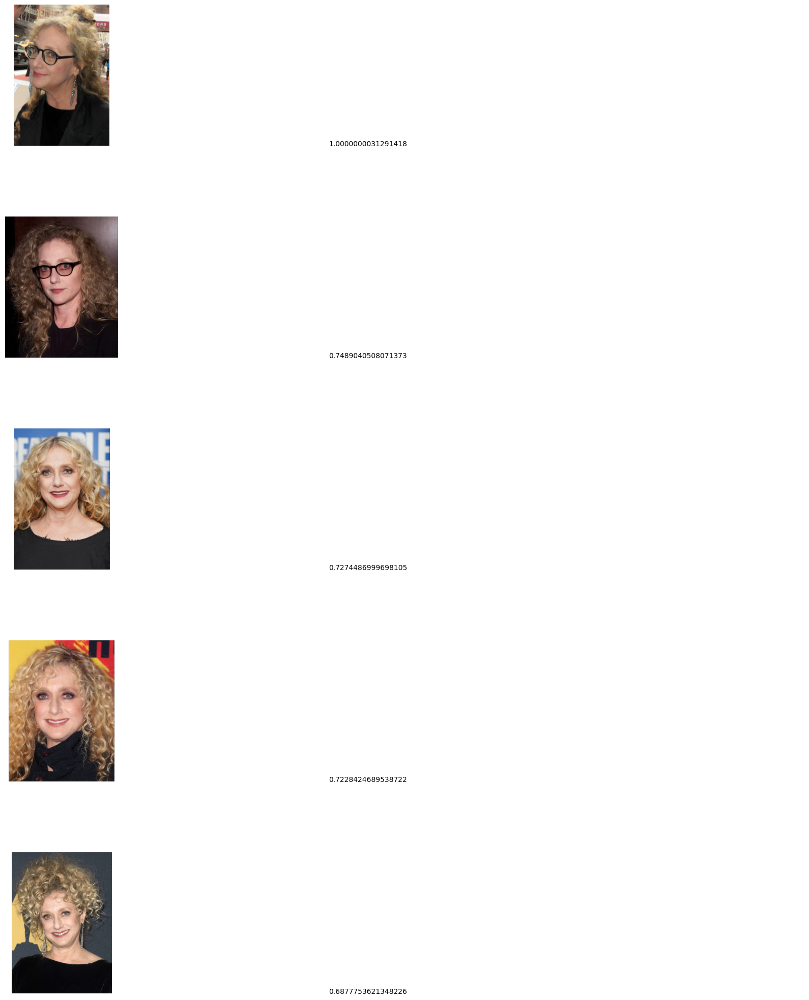

In [48]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample5) Caspar Jennings

In [49]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Caspar_Jennings_0.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
875,gs://jc-gcp-project-01/SEC_content_recognition...,1733809864909886,image/jpeg,270777,88375129665d8d2e6d6778420ac5a38f,2024-12-10 05:51:04.913000+00:00,[],Caspar_Jennings,"[-0.0295332242, 0.0369284227, -0.0291601904, 0...","[-0.00698374538, -0.0192482546, 0.00426388951,..."


In [50]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Caspar_Jennings_0.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Caspar_Jennings

1.0000 Caspar_Jennings
0.8535 Caspar_Jennings
0.8097 Caspar_Jennings
0.7818 Caspar_Jennings
0.7247 Timothée_Chalamet
0.7085 Timothée_Chalamet
0.6876 Timothée_Chalamet
0.6811 Timothée_Chalamet
0.6784 Jacob_Tremblay
0.6728 Timothée_Chalamet
0.6679 Timothée_Chalamet
0.6642 Honor_Kneafsey
0.6604 Casey_Affleck
0.6576 Austin_Butler
0.6524 Rebecca_Ferguson
0.6481 Fabrizio_Rongione
0.6477 Caspar_Jennings
0.6456 Timothée_Chalamet
0.6410 Jacob_Tremblay
0.6406 Carol_Kane


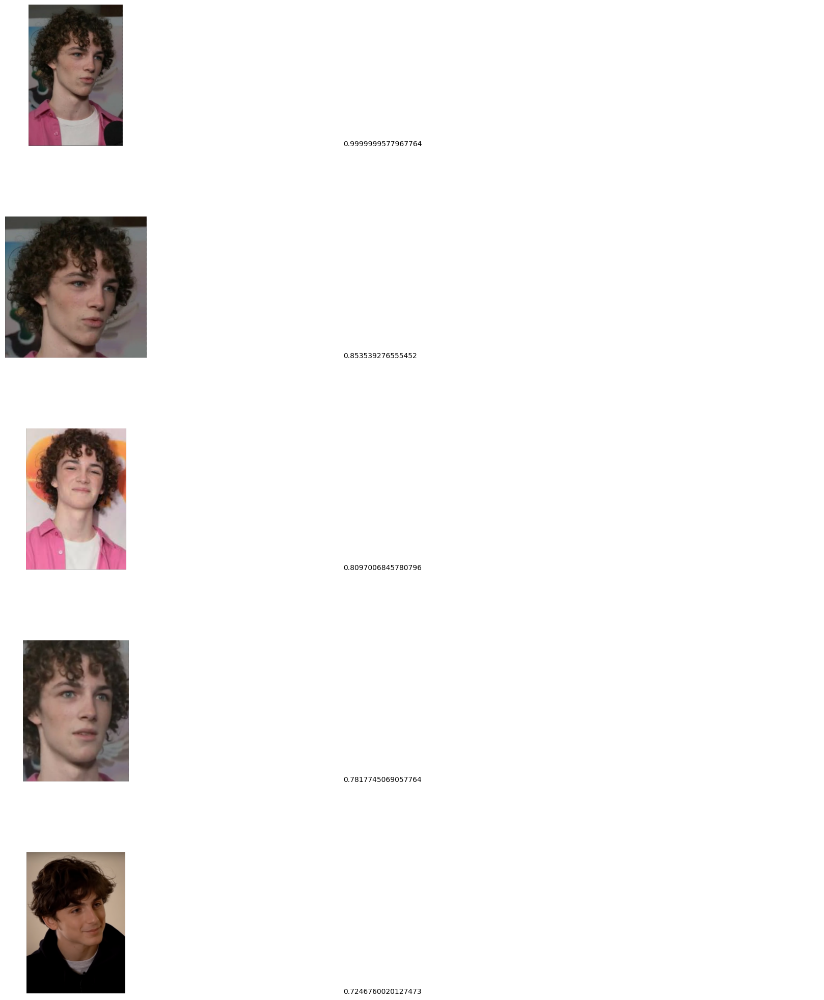

In [51]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample6) 최기화

In [52]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Choi_Gwi-hwa_0.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
460,gs://jc-gcp-project-01/SEC_content_recognition...,1733809470483425,image/jpeg,336255,d8ac8c3101e50aa7a0e3a9f414da4f7a,2024-12-10 05:44:30.485000+00:00,[],Choi_Gwi-hwa,"[-0.0301137064, 0.0697112083, -0.0455944352, 0...","[-0.00589278201, -0.0110394945, 0.00816752575,..."


In [53]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Choi_Gwi-hwa_0.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Choi_Gwi-hwa

1.0000 Choi_Gwi-hwa
0.8672 Choi_Gwi-hwa
0.8451 Park_Hyuk-kwon
0.8287 Kim_Sung-kyun
0.8216 Kim_Sung-kyun
0.8144 Kim_Rae-won
0.8134 Choi_Gwi-hwa
0.8107 Park_Hyuk-kwon
0.8036 Park_Hyuk-kwon
0.7995 Park_Hyuk-kwon
0.7969 Kwak_Do-won
0.7961 Hwang_Jung-min
0.7921 Im_Won-hee
0.7819 Kwak_Do-won
0.7814 Kwak_Do-won
0.7811 Hwang_Jung-min
0.7802 Park_Hyuk-kwon
0.7782 Kwak_Do-won
0.7763 Kim_Sung-kyun
0.7761 Lee_Sung-min


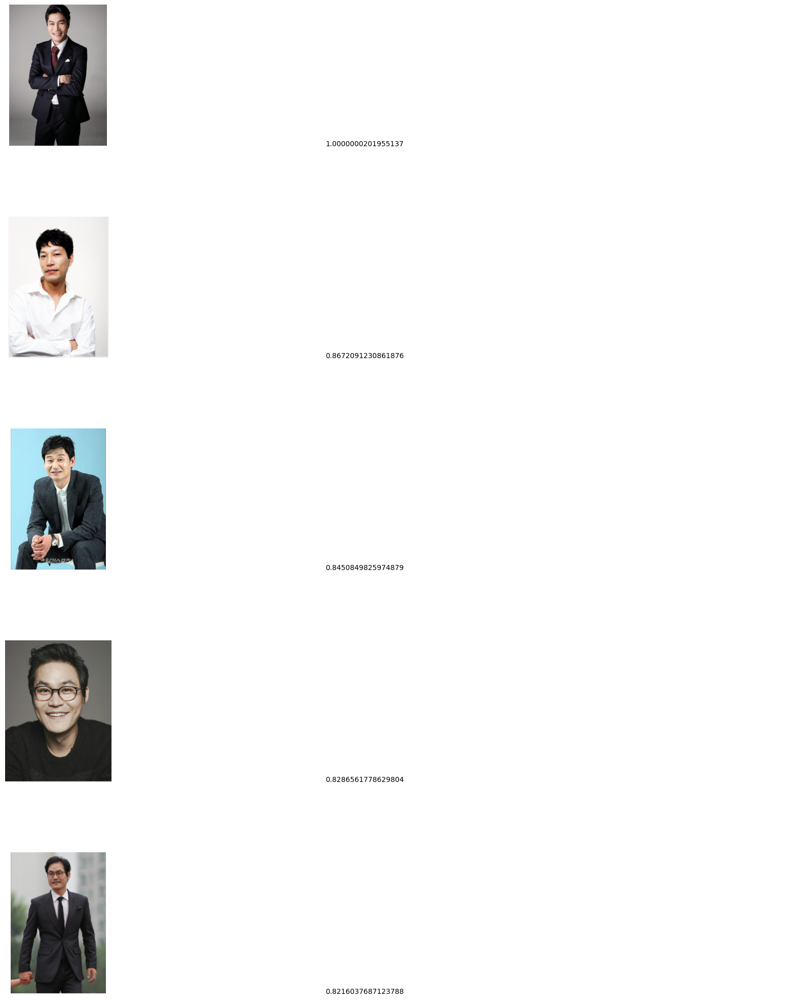

In [54]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample7) Fei_Xiang

In [55]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Fei_Xiang_0.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
120,gs://jc-gcp-project-01/SEC_content_recognition...,1733809871169105,image/jpeg,354494,701fee1fb592fa9d83ffaab1b60dcc20,2024-12-10 05:51:11.171000+00:00,[],Fei_Xiang,"[-0.0385492183, 0.0136373974, -0.049487967, 0....","[-0.0100276945, -0.0245832633, -0.0116129778, ..."


In [56]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Fei_Xiang_0.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Fei_Xiang

1.0000 Fei_Xiang
0.8485 Fei_Xiang
0.8207 Fei_Xiang
0.7960 Fei_Xiang
0.7542 Fei_Xiang
0.7182 Aaron_Kwok
0.7025 Fei_Xiang
0.6990 Fei_Xiang
0.6847 Aaron_Kwok
0.6831 Eddie_Cheung
0.6701 Donnie_Yen
0.6701 Lee_Jung-jae
0.6659 Fei_Xiang
0.6640 Jung_Woo-sung
0.6579 Eddie_Cheung
0.6525 Fei_Xiang
0.6518 Im_Won-hee
0.6487 Choi_Min-sik
0.6454 Chang_Chen
0.6427 Aaron_Kwok


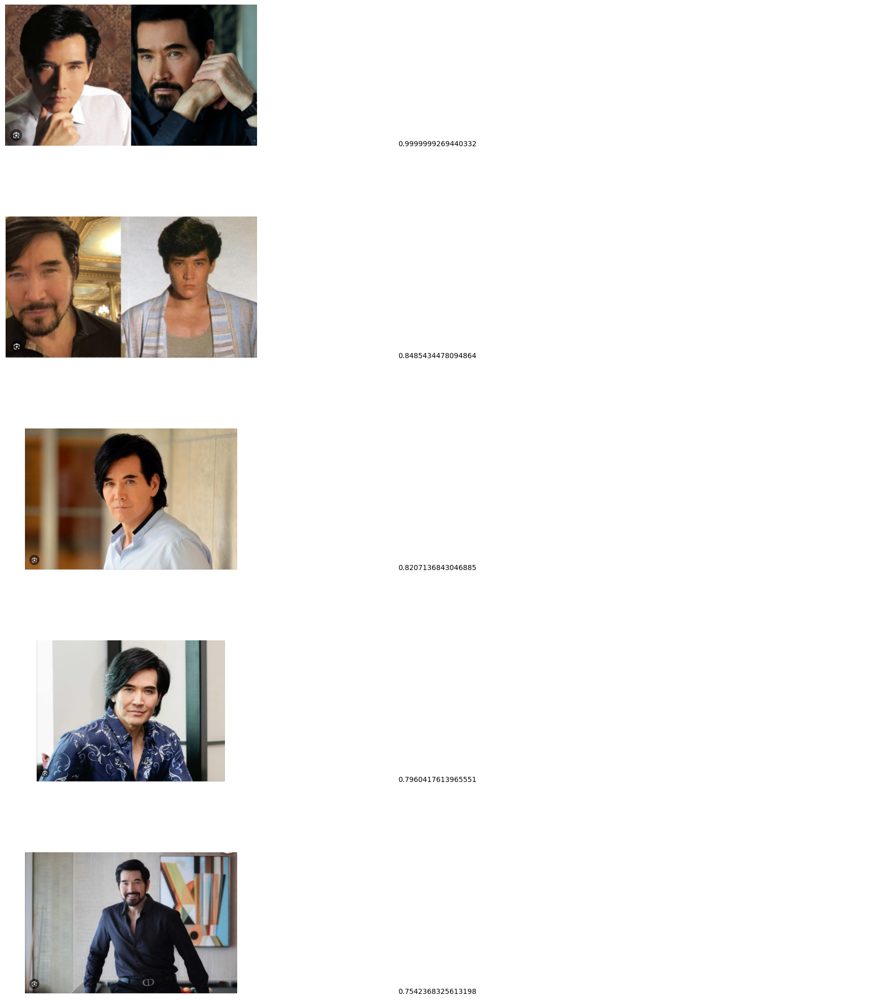

In [57]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample8) 고아성

In [58]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Go_Ah-sung_0.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
250,gs://jc-gcp-project-01/SEC_content_recognition...,1733809611218765,image/jpeg,497154,abd9f8d7bb7a720ac99e083d8ff11196,2024-12-10 05:46:51.220000+00:00,[],Go_Ah-sung,"[-0.0455677174, 0.0548019782, -0.0210108962, 0...","[-0.025898613, -0.0347189233, -0.00395523198, ..."


In [59]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Go_Ah-sung_0.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Go_Ah-sung

1.0000 Go_Ah-sung
0.8528 Go_Ah-sung
0.8375 Go_Ah-sung
0.8190 Kim_Go-eun
0.8003 Han_Ye-ri
0.7969 Chun_Woo-hee
0.7819 Go_Ah-sung
0.7729 Go_Ah-sung
0.7685 Esom
0.7675 Han_Hyo-joo
0.7639 Go_Ah-sung
0.7618 Esom
0.7599 Kim_Go-eun
0.7573 Barbie_Hsu
0.7558 Baek_Jin-hee
0.7524 Baek_Jin-hee
0.7520 Yum_Jung-ah
0.7506 Baek_Jin-hee
0.7494 Go_Ah-sung
0.7420 Yum_Jung-ah


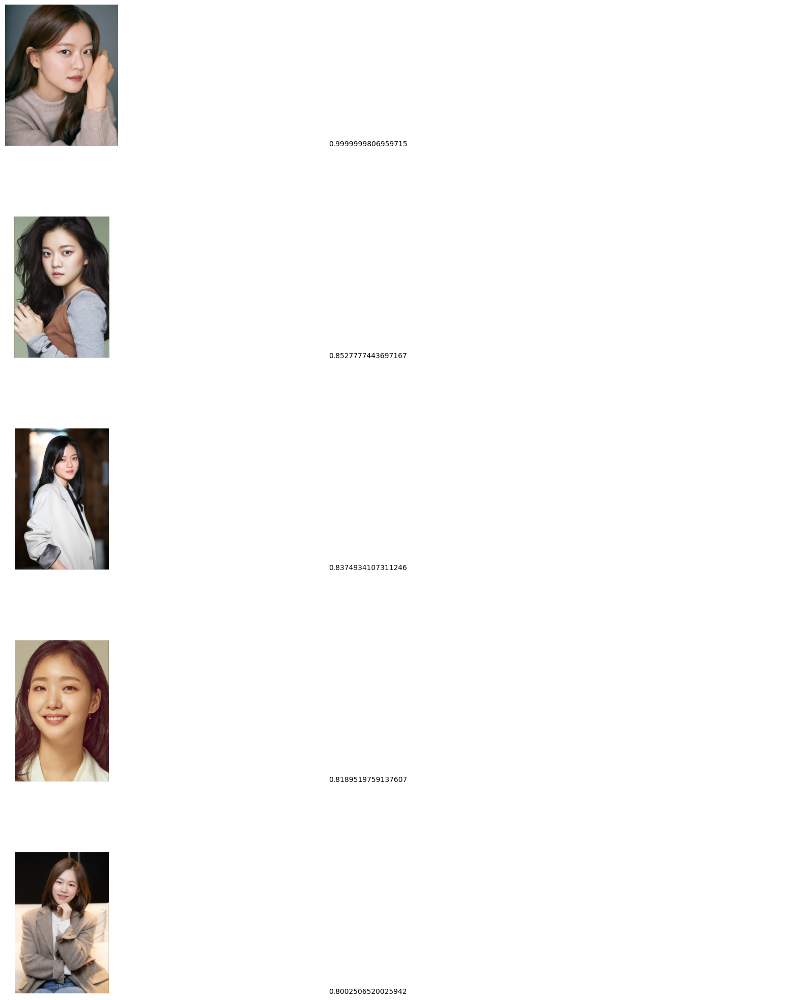

In [60]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample9) 고민시

In [61]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Go_Min-si_0.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
130,gs://jc-gcp-project-01/SEC_content_recognition...,1733809873086262,image/jpeg,152826,8d2783c490fe81839c73656d1851f092,2024-12-10 05:51:13.089000+00:00,[],Go_Min-si,"[-0.00343031203, 0.0322074033, -0.0226032697, ...","[-0.0228876416, -0.0620563887, 0.0215639398, 0..."


In [62]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Go_Min-si_0.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Go_Min-si

1.0000 Go_Min-si
0.8088 Go_Min-si
0.7695 BoA
0.7671 Go_Min-si
0.7644 BoA
0.7580 Gong_Seung-yeon
0.7390 Bae_Jong-ok
0.7220 Cya_Liu
0.7200 Esom
0.7145 Im_Won-hee
0.7122 Esom
0.7102 Ha_Ji-won
0.7075 Kim_Go-eun
0.7069 Go_Ah-sung
0.7000 Esom
0.6955 Barbie_Hsu
0.6910 Han_Ye-ri
0.6906 Barbie_Hsu
0.6905 Esom
0.6861 Esom


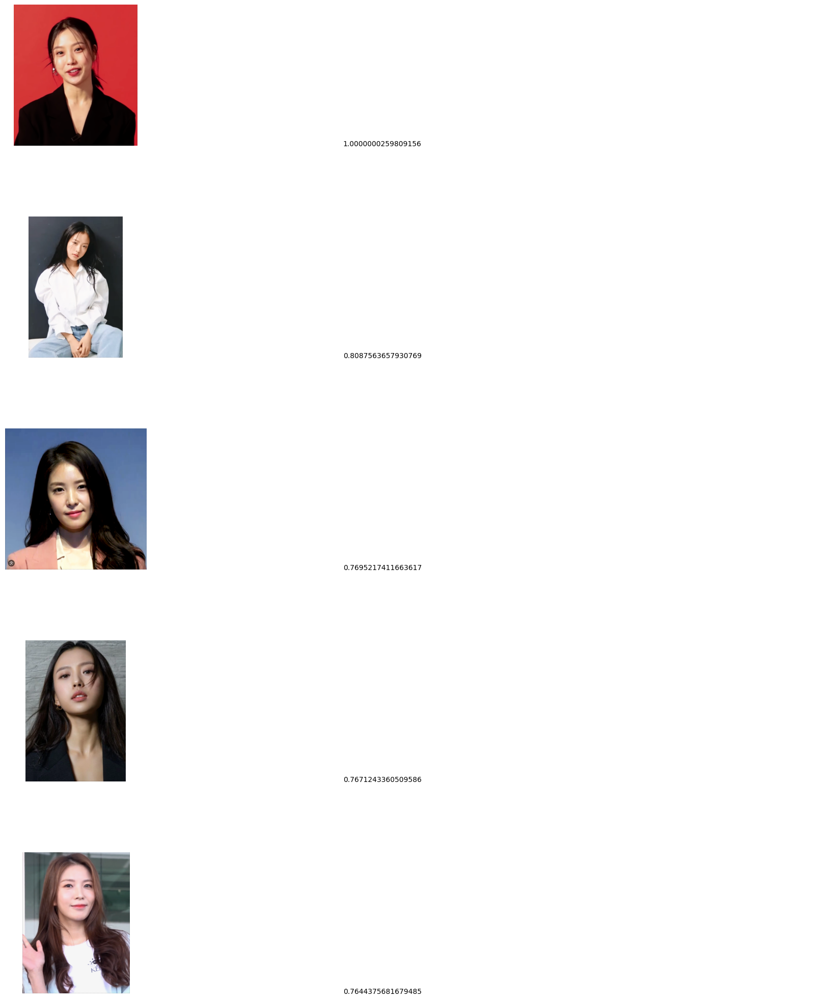

In [63]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample10) Gong Li

In [93]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Gong_Li_1.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
31,gs://jc-gcp-project-01/SEC_content_recognition...,1733809909157797,image/jpeg,500717,7ca765e0edf1a3b72652eb1617cb729c,2024-12-10 05:51:49.159000+00:00,[],Gong_Li,"[0.00214768643, 0.0476833209, -0.016819194, 0....","[-0.00093368, 0.0268174615, 0.0257348288, 0.02..."


In [97]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Gong_Li_7.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Gong_Li

1.0000 Gong_Li
0.7625 Gong_Li
0.7364 Barbie_Hsu
0.7122 Gong_Li
0.7114 Fei_Xiang
0.7091 Barbie_Hsu
0.6551 Feng_Shaofeng
0.6540 Ma_Dong-seok
0.6499 Han_Hyo-joo
0.6470 Gong_Li
0.6453 Cya_Liu
0.6431 Ha_Ji-won
0.6410 BoA
0.6409 Go_Min-si
0.6361 Gong_Li
0.6350 Him_Law
0.6349 Eddie_Cheung
0.6323 Grace_Wong
0.6295 Harvey_Guillén
0.6272 Gong_Li


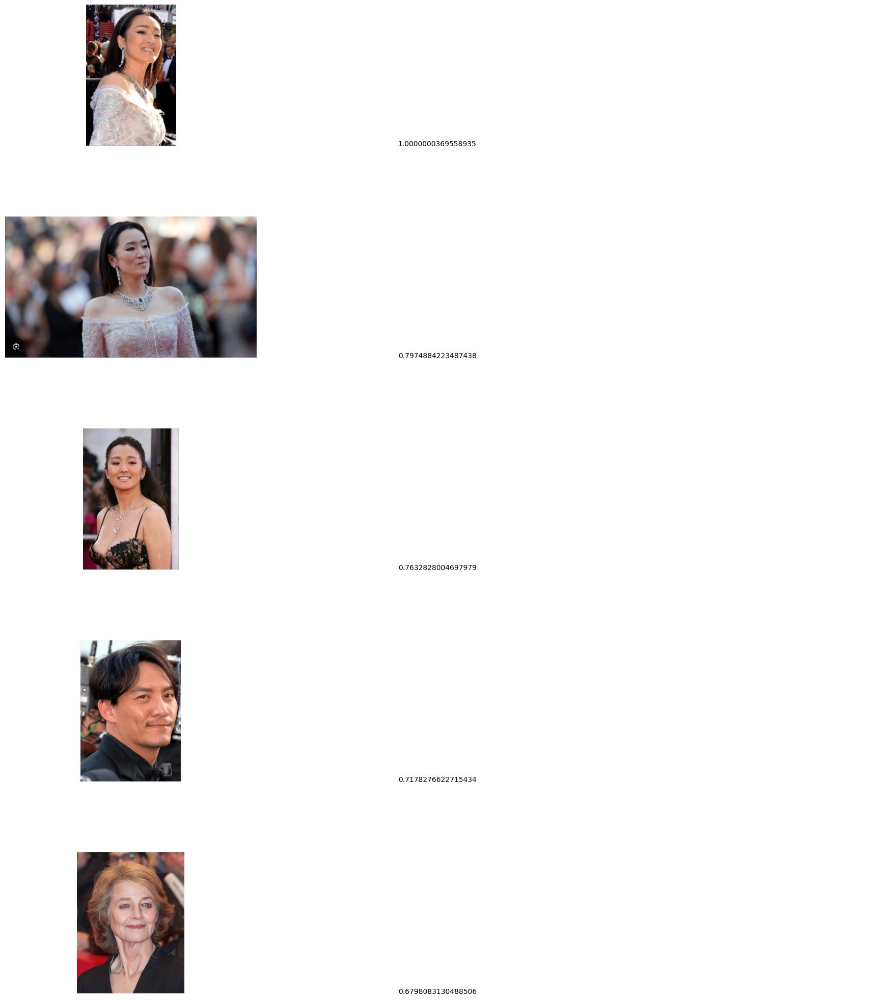

In [96]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample11) 공승연

In [67]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Gong_Seung-yeon_1.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
891,gs://jc-gcp-project-01/SEC_content_recognition...,1733809732392814,image/jpeg,399930,4c67f03b1a3d8bd979b3a5b32bd69157,2024-12-10 05:48:52.395000+00:00,[],Gong_Seung-yeon,"[-0.053026922, 0.0484479107, -0.0485617444, 0....","[-0.0231535267, -0.0205366947, 0.00510280067, ..."


In [68]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Gong_Seung-yeon_1.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Gong_Seung-yeon

1.0000 Gong_Seung-yeon
0.7894 Gong_Seung-yeon
0.7510 Baek_Jin-hee
0.7498 Gong_Seung-yeon
0.7417 Baek_Jin-hee
0.7413 Go_Min-si
0.7368 Go_Ah-sung
0.7299 Ha_Ji-won
0.7264 Go_Min-si
0.7263 Go_Min-si
0.7241 Esom
0.7218 Kim_Go-eun
0.7214 Go_Ah-sung
0.7186 Baek_Jin-hee
0.7178 Barbie_Hsu
0.7175 Go_Ah-sung
0.7065 Bae_Jong-ok
0.7062 Yum_Jung-ah
0.7035 Kim_Go-eun
0.7029 Gong_Seung-yeon


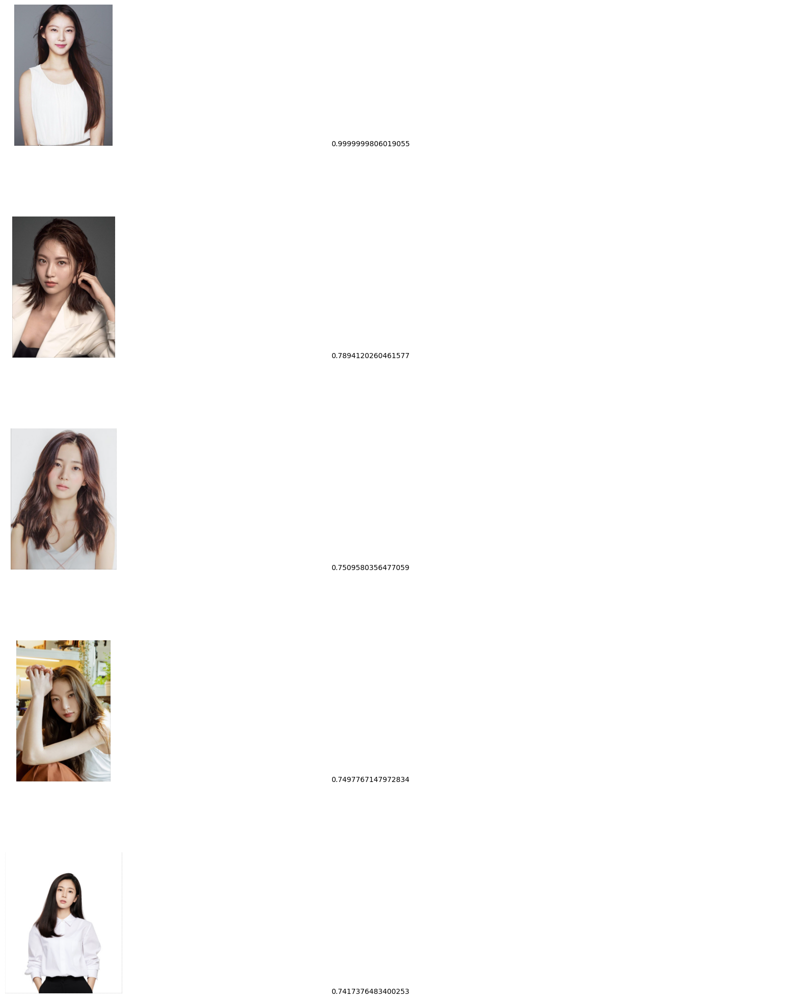

In [69]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample12) Grace Wong

In [70]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Grace_Wong_8.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
264,gs://jc-gcp-project-01/SEC_content_recognition...,1733809848032082,image/jpeg,294289,c9bd22091522afdcb78a60c16e9b94ac,2024-12-10 05:50:48.034000+00:00,[],Grace_Wong,"[-0.024694005, 0.0237113442, -0.0107692098, 0....","[-0.0277266372, -0.022476729, 0.00772543717, -..."


In [71]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Grace_Wong_8.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Grace_Wong

1.0000 Grace_Wong
0.7993 Grace_Wong
0.7786 Grace_Wong
0.7680 Cya_Liu
0.7443 Grace_Wong
0.7282 Cya_Liu
0.7273 Cya_Liu
0.7219 Grace_Wong
0.7201 Eddie_Cheung
0.7148 Grace_Wong
0.7135 BoA
0.7050 Yum_Jung-ah
0.7033 Grace_Wong
0.6963 Feng_Shaofeng
0.6903 Aaron_Kwok
0.6806 Ha_Ji-won
0.6798 Barbie_Hsu
0.6768 Him_Law
0.6762 Gong_Li
0.6761 BoA


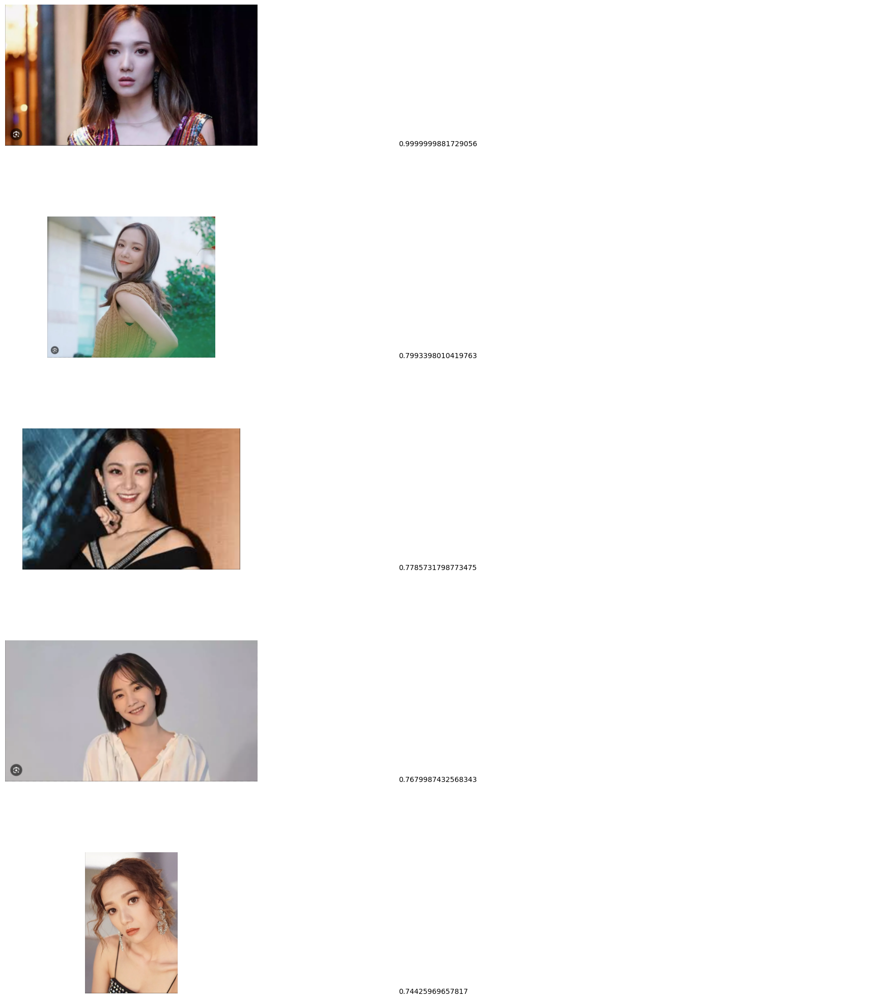

In [72]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample13) Jun Kunimura

In [73]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Jun_Kunimura_2.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
532,gs://jc-gcp-project-01/SEC_content_recognition...,1733809771177588,image/jpeg,187865,1a7968975fdd93815225730f71c9ad4e,2024-12-10 05:49:31.179000+00:00,[],Jun_Kunimura,"[-0.00181733246, 0.0872893855, -0.021944385, 0...","[-0.00328833447, 0.00308102206, 0.00464898068,..."


In [74]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Jun_Kunimura_2.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Jun_Kunimura

1.0000 Jun_Kunimura
0.9058 Jun_Kunimura
0.8321 Lee_Sung-min
0.8313 Choi_Min-sik
0.8199 Jung_Jin-young
0.7983 Im_Won-hee
0.7812 Kwak_Do-won
0.7809 Lee_Sung-min
0.7795 Choi_Min-sik
0.7666 Lee_Sung-min
0.7656 Lee_Sung-min
0.7653 Im_Won-hee
0.7613 Lee_Sung-min
0.7605 Kim_Sung-kyun
0.7604 Hwang_Jung-min
0.7508 Park_Hyuk-kwon
0.7482 Park_Hyuk-kwon
0.7472 Ma_Dong-seok
0.7471 Kwak_Do-won
0.7454 Jun_Kunimura


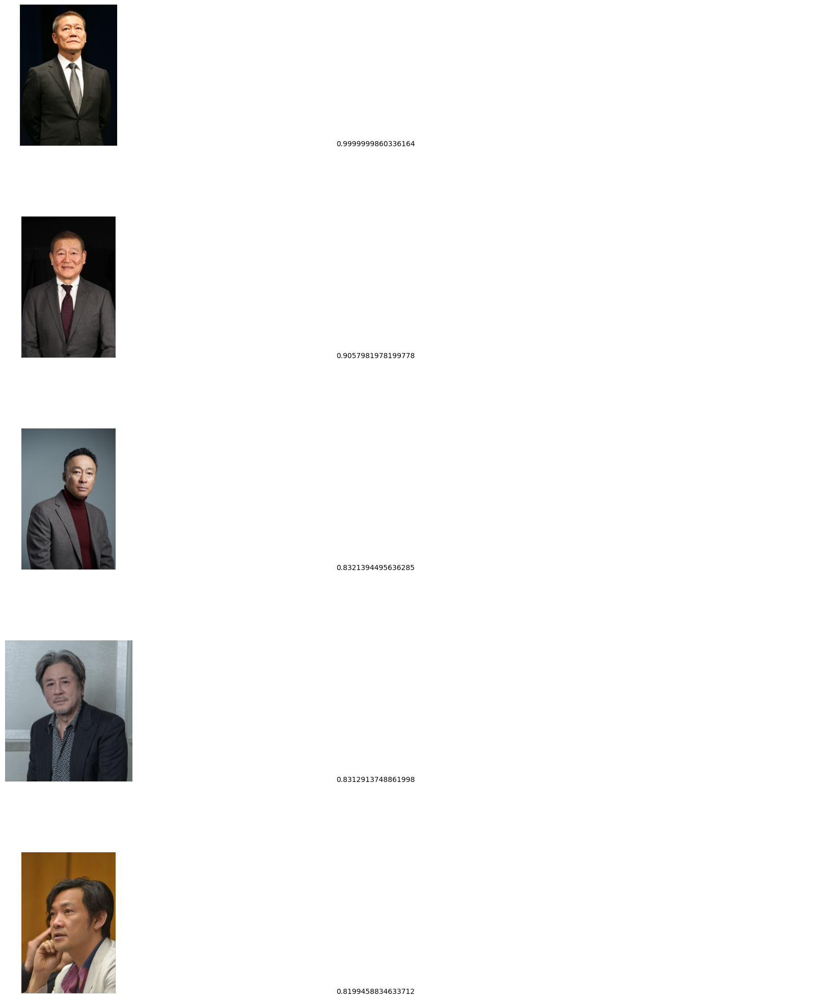

In [75]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample14) 정진영

In [76]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Jung_Jin-young_3.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
827,gs://jc-gcp-project-01/SEC_content_recognition...,1733809687384473,image/jpeg,643369,56119fd0bae6ebbfb40ee880544bea93,2024-12-10 05:48:07.387000+00:00,[],Jung_Jin-young,"[-0.0158047639, 0.028874971, -0.0196530689, 0....","[-0.000275701081, -0.0241429191, 0.035550952, ..."


In [77]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Jung_Jin-young_3.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Jung_Jin-young

1.0000 Jung_Jin-young
0.6923 Jung_Jin-young
0.6307 Lee_Do-hyun
0.6252 Esom
0.6105 Jung_Jin-young
0.6034 Lee_Do-hyun
0.6005 Esom
0.6000 Lee_Joon-hyuk
0.5989 Kim_Rae-won
0.5861 Ha_Jung-woo
0.5839 Kim_Go-eun
0.5813 Park_Jeong-min
0.5812 Park_Jeong-min
0.5810 Lee_Sung-min
0.5802 Jung_Woo-sung
0.5742 Lee_Do-hyun
0.5724 Choi_Gwi-hwa
0.5717 Yum_Jung-ah
0.5710 Park_Jeong-min
0.5696 Kim_Sung-kyun


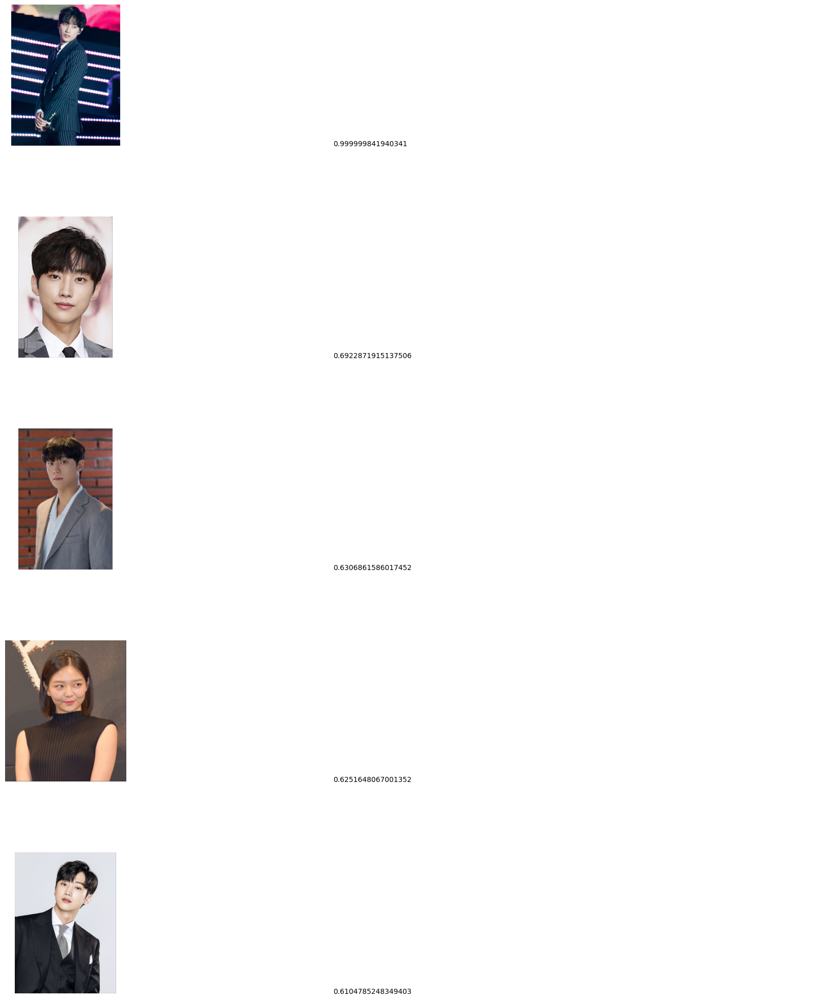

In [78]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

### Sample15) 정우성

In [79]:
actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Jung_Woo-sung_3.jpg']

,uri,generation,content_type,size,md5_hash,updated,metadata,celeb_name,image_embedding,text_embedding
696,gs://jc-gcp-project-01/SEC_content_recognition...,1733809861194669,image/jpeg,521747,b67a1767c6b88ccfe3640673880d46e8,2024-12-10 05:51:01.197000+00:00,[],Jung_Woo-sung,"[-0.0382907, 0.0677997395, -0.0426974669, 0.00...","[-0.00302464236, -0.00600131927, -0.0041981255..."


In [80]:
key = actor_title[actor_title['uri'] == 'gs://jc-gcp-project-01/SEC_content_recognition/Celebrity_TestData/Jung_Woo-sung_3.jpg'].index[0]
embs = np.array(actor_title.image_embedding.to_list())
similarities = np.dot(embs[key], embs.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.celeb_name, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

Key question: Jung_Woo-sung

1.0000 Jung_Woo-sung
0.9003 Jung_Woo-sung
0.8905 Jung_Woo-sung
0.8659 Park_Hae-joon
0.8648 Park_Hae-joon
0.8548 Jung_Woo-sung
0.8527 Lee_Jung-jae
0.8513 Shin_Ha-kyun
0.8504 Jung_Woo-sung
0.8475 Lee_Jung-jae
0.8428 Ha_Jung-woo
0.8324 Shin_Ha-kyun
0.8321 Lee_Jung-jae
0.8302 Park_Hae-joon
0.8282 Choi_Gwi-hwa
0.8245 Lee_Jung-jae
0.8228 Choi_Gwi-hwa
0.8213 Hyun_Bin
0.8205 Jang_Hyuk
0.8182 Park_Hae-joon


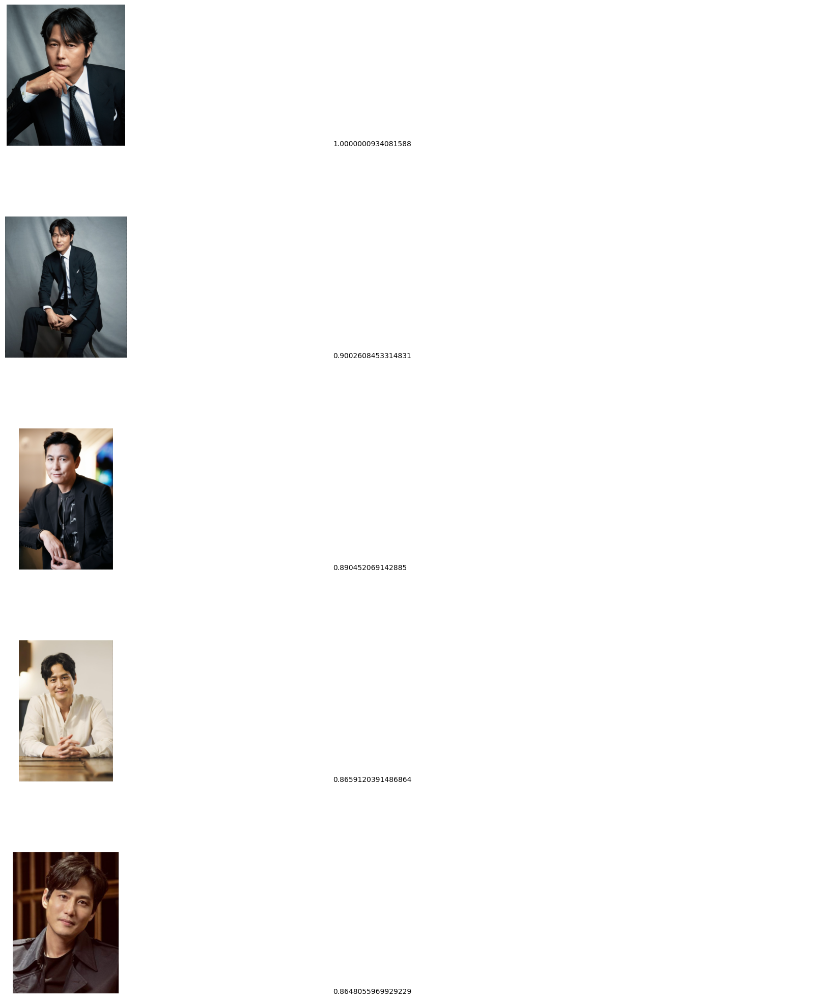

In [81]:
img_df = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:5]
printImages(img_df)

In [ ]:
key = 696
embs_txt = np.array(actor_title.text_embedding.to_list())
embs_img = np.array(actor_title.image_embedding.to_list())

similarities = np.dot(embs_txt[key], embs_img.T)
# print the question
print(f"Key question: {actor_title.celeb_name[key]}\n")

# sort and print the questions by similarities
sorted_questions = sorted(
    zip(actor_title.uri, similarities), key=lambda x: x[1], reverse=True
)[:20]
for i, (question, similarity) in enumerate(sorted_questions):
    print(f"{similarity:.4f} {question}")

# Under construction

In [ ]:
actor_title['id'] = range(1, len(actor_title) + 1)

In [ ]:
# save id and embedding as a json file
jsonl_string = actor_title[["id", "image_embedding"]].to_json(orient="records", lines=True)
with open("celeb_embeddings.json", "w") as f:
    f.write(jsonl_string)

# show the first few lines of the json file
! head -n 3 celeb_embeddings.json

In [ ]:
BUCKET_URI = f"gs://{PROJECT_ID}-celeb-emb-20241211"
! gsutil mb -l $LOCATION -p {PROJECT_ID} {BUCKET_URI}
! gsutil cp celeb_embeddings.json {BUCKET_URI}

In [ ]:
###### init the aiplatform package
from google.cloud import aiplatform
aiplatform.init(project=PROJECT_ID, location=LOCATION)

In [ ]:
# create index
my_index = aiplatform.MatchingEngineIndex.create_tree_ah_index(
    display_name="celeb_img_idx",
    contents_delta_uri=BUCKET_URI,
    dimensions=1408,
    approximate_neighbors_count=20,
    distance_measure_type="DOT_PRODUCT_DISTANCE",
)

In [ ]:
# create IndexEndpoint
my_index_endpoint = aiplatform.MatchingEngineIndexEndpoint.create(
    display_name="celeb_img_idx_endpoint",
    public_endpoint_enabled=True,
)

In [ ]:
DEPLOYED_INDEX_ID = "celeb_deployed_idx_id"

In [ ]:
# deploy the Index to the Index Endpoint
my_index_endpoint.deploy_index(index=my_index, deployed_index_id=DEPLOYED_INDEX_ID)

Run Query

In [ ]:
###### Call Endpoint
from google.cloud import aiplatform_v1

# Set variables for the current deployed index.
API_ENDPOINT="1051074875.us-central1-78565683329.vdb.vertexai.goog" # 수정
INDEX_ENDPOINT="projects/78565683329/locations/us-central1/indexEndpoints/664311731362725888" # 수정
DEPLOYED_INDEX_ID="celeb_deployed_idx_id"

In [ ]:
###### Call Endpoint
PROJECT_ID = "jc-gcp-project"
REGION = "us-central1"
ENDPOINT_ID = "664311731362725888"

In [ ]:
###### Call Endpoint
my_index_endpoint = aiplatform.MatchingEngineIndexEndpoint(
    index_endpoint_name=f"projects/{PROJECT_ID}/locations/{REGION}/indexEndpoints/{ENDPOINT_ID}"
)

In [ ]:
###### Test
query = '니가 가라 하와이'
test_embeddings = get_embeddings_wrapper([query])

In [ ]:
###### Test query
response = my_index_endpoint.find_neighbors(
    deployed_index_id=DEPLOYED_INDEX_ID,
    queries=test_embeddings,
    num_neighbors=20,
)

# show the result
import numpy as np

for idx, neighbor in enumerate(response[0]):
    id = np.int64(neighbor.id)
    similar = df.query("id == @id", engine="python")
    print(f"{neighbor.distance:.4f} {similar.title.values[0]}")